In [63]:
import os
import random
import joblib
import numpy as np
import pandas as pd
import numpy.ma as ma
import seaborn as sns
import rasterio as rio
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

In [2]:
from matplotlib import colorbar
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
from matplotlib.gridspec import GridSpec
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.gridspec import GridSpecFromSubplotSpec

In [73]:
from symbolearn.fitness import Fitness
from symbolearn.utils import otsu_threshold
from symbolearn.utils import stratified_train_test_split
from sklearn.utils.random import check_random_state
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from symbolearn.metrics.transformer import directional_otsu_separability
from symbolearn.symbolic_estimators import SymbolicRegressor, SymbolicClassifier, SymbolicTransformer

In [4]:
# 设置全局字体为新罗马（Times New Roman）
plt.rcParams['font.family'] = 'serif'  # 使用衬线字体
plt.rcParams['font.serif'] = ['Times New Roman']  # 指定新罗马为衬线字体
plt.rcParams['mathtext.fontset'] = 'stix'  # 数学公式字体（与新罗马风格一致）

# 可选：设置其他全局参数
plt.rcParams['axes.unicode_minus'] = False  # 解决负号显示问题

# UTILS

In [5]:
def linear_stretch(image, lower_percent=1, upper_percent=99):
    """对多波段图像进行线性拉伸"""
    stretched = np.zeros_like(image, dtype=np.float32)
    for band in range(image.shape[2]):  # 遍历每个波段
        band_data = image[:, :, band]
        # 计算1%和99%分位数
        lower = np.percentile(band_data, lower_percent)
        upper = np.percentile(band_data, upper_percent)
        # 线性拉伸到 [0, 1]
        stretched[:, :, band] = np.clip((band_data - lower) / (upper - lower), 0, 1)
    return stretched

In [6]:
import re

def calculate_spectral_index(data_df, equation, bands):
    """
    根据字符串公式计算植被指数
    
    参数:
    data_df: DataFrame, 包含各波段数据的数据框
    equation: str, 计算公式字符串，如 'NIR - Red' 或 '(NIR - Red) / (NIR + Red)'
    bands: list, 可用的波段名称列表
    
    返回:
    pandas.Series, 计算得到的指数值
    """
    # 创建一个副本来避免修改原始公式
    formula = equation
    
    # 为每个波段创建临时变量名，避免波段名称冲突
    # 例如：NIR -> band_NIR, Red -> band_Red
    band_mapping = {}
    
    # 按波段名称长度排序，先替换长的波段名，避免部分匹配问题
    sorted_bands = sorted(bands, key=len, reverse=True)
    
    for band in sorted_bands:
        if band in data_df.columns:
            # 使用正则表达式确保完整匹配波段名称
            pattern = r'\b' + re.escape(band) + r'\b'
            temp_var = f'band_{band}'
            formula = re.sub(pattern, temp_var, formula)
            band_mapping[temp_var] = data_df[band]
    
    # 创建计算环境，只包含波段数据和必要的函数
    calc_env = band_mapping.copy()
    calc_env.update({
        'np': np,
        'abs': abs,
        'sqrt': np.sqrt,
        'log': np.log,
        'exp': np.exp,
        'sin': np.sin,
        'cos': np.cos,
        'tan': np.tan
    })
    
    try:
        # 使用eval计算公式
        result = eval(formula, {"__builtins__": {}}, calc_env)
        
        # 确保返回pandas Series
        if not isinstance(result, pd.Series):
            result = pd.Series(result, index=data_df.index)
            
        return result.values
        
    except Exception as e:
        raise ValueError(f"计算公式 '{equation}' 时出错: {str(e)}")

In [7]:
def clip_array_by_percentile(arr, lower_percentile=1, upper_percentile=99):
    """
    对输入的 NumPy 数组进行分位数截断（替换超出范围的值）。
    支持一维和二维数组，对于二维数组按列处理。
    
    参数:
        arr (np.ndarray): 输入的数组，可以是形状为 (N,) 的一维数组或 (N, m) 的二维数组。
        lower_percentile (float): 下分位数（默认 1%）。
        upper_percentile (float): 上分位数（默认 99%）。
    
    返回:
        np.ndarray: 截断后的数组，形状与输入一致。
    
    示例:
        >>> arr = np.array([1, 2, 3, 4, 5, 100])
        >>> clip_array_by_percentile(arr, 10, 90)
        array([2, 2, 3, 4, 5, 5])
    """
    # 确保输入是 numpy 数组
    arr = np.asarray(arr)
    
    # 处理一维数组
    if arr.ndim == 1:
        low = np.percentile(arr, lower_percentile)
        high = np.percentile(arr, upper_percentile)
        return np.clip(arr, low, high)
    
    # 处理二维数组
    elif arr.ndim == 2:
        # 计算每列的分位数
        low = np.percentile(arr, lower_percentile, axis=0)  # shape=(m,)
        high = np.percentile(arr, upper_percentile, axis=0)  # shape=(m,)
        
        # 扩展分位数矩阵以匹配输入数组的形状
        low_matrix = np.tile(low, (arr.shape[0], 1))
        high_matrix = np.tile(high, (arr.shape[0], 1))
        
        # 使用 np.clip 进行截断
        return np.clip(arr, low_matrix, high_matrix)
    
    else:
        raise ValueError("输入数组的维度必须是1或2")

In [8]:
def make_taichi(n_samples=150, noise=0.1, random_state=None):
    """
    生成太极图案数据集
    
    参数:
    n_samples: int, 样本总数
    noise: float, 噪声水平 (0-1之间)
    random_state: int, 随机种子
    
    返回:
    X: ndarray of shape (n_samples, 2), 特征矩阵
    y: ndarray of shape (n_samples,), 标签 (0或1)
    """
    if random_state is not None:
        np.random.seed(random_state)
    
    # 在圆形区域内均匀生成点
    theta = np.random.uniform(0, 2*np.pi, n_samples)
    r = np.sqrt(np.random.uniform(0, 1, n_samples))  # 平方根使分布更均匀
    
    x = r * np.cos(theta) * 2  # 乘以2使圆的半径为2
    y = r * np.sin(theta) * 2
    
    # 使用S形曲线分割: y_boundary = sin(x)
    y_boundary = np.sin(x * np.pi / 1.8) * 0.8  # 调整振幅
    
    # 计算每个点到分割线的距离
    distance_to_boundary = np.abs(y - y_boundary)
    
    # 根据点在S曲线上方还是下方来分类
    labels = (y > y_boundary).astype(int)
    
    # 添加噪声：只翻转靠近分割线的点的标签
    if noise > 0:
        # 计算一个距离阈值，只有距离小于这个阈值的点才可能被翻转
        distance_threshold = np.percentile(distance_to_boundary, 30)  # 只考虑最近的30%的点
        
        # 找出靠近边界的点
        near_boundary = distance_to_boundary < distance_threshold
        near_boundary_indices = np.where(near_boundary)[0]
        
        # 从这些靠近边界的点中随机选择一些来翻转
        n_flip = int(len(near_boundary_indices) * noise)
        if n_flip > 0:
            flip_indices = np.random.choice(near_boundary_indices, n_flip, replace=False)
            labels[flip_indices] = 1 - labels[flip_indices]
    
    X = np.column_stack([x, y])
    
    return X, labels


def make_shifted_circle(n_samples=150, shift=1.5, cut_angle=30, noise=0.15, random_state=None):
    """
    生成切开并错位的圆形数据集
    
    参数:
    n_samples: int, 样本总数
    shift: float, 错位距离（沿着切线方向）
    cut_angle: float, 切割线的角度（度数）
    noise: float, 噪声水平 (0-1之间)，控制重叠程度
    random_state: int, 随机种子
    
    返回:
    X: ndarray of shape (n_samples, 2), 特征矩阵
    y: ndarray of shape (n_samples,), 标签 (0或1)
    """
    if random_state is not None:
        np.random.seed(random_state)
    
    # 在圆形区域内均匀生成点
    theta = np.random.uniform(0, 2*np.pi, n_samples)
    # 半径为2的圆
    r1 = np.sqrt(np.random.uniform(0, 0.5, n_samples // 3)) * 2
    r2 = np.sqrt(np.random.uniform(0.5, 1, n_samples - n_samples // 3)) * 2
    r = np.hstack([r1, r2])
    
    x = r * np.cos(theta)
    y = r * np.sin(theta)
    
    # 计算切割线（通过原点，角度为cut_angle）
    cut_angle_rad = np.radians(cut_angle)
    # 切割线的法向量
    normal_x = np.cos(cut_angle_rad)
    normal_y = np.sin(cut_angle_rad)
    # 切线方向（垂直于法向量）
    tangent_x = -normal_y
    tangent_y = normal_x
    
    # 判断每个点在切割线的哪一侧
    side = x * normal_x + y * normal_y
    
    X_list = []
    y_list = []
    
    # 分离两部分并沿切线方向错位
    for i in range(n_samples):
        if side[i] >= 0:
            # 第一部分：沿切线正方向移动
            X_list.append([x[i] + shift * tangent_x, y[i] + shift * tangent_y])
            y_list.append(0)
        else:
            # 第二部分：沿切线负方向移动
            X_list.append([x[i] - shift * tangent_x, y[i] - shift * tangent_y])
            y_list.append(1)
    
    X = np.array(X_list)
    labels = np.array(y_list)
    
    # 添加噪声：只翻转在两个半圆接近区域的点
    if noise > 0:
        # 计算两个类别的中心
        center_0 = np.mean(X[labels == 0], axis=0)
        center_1 = np.mean(X[labels == 1], axis=0)
        
        # 对于每个点，计算它到另一个类别中心的距离
        distances_to_other_class = []
        for i in range(n_samples):
            if labels[i] == 0:
                # 类别0的点，计算到类别1中心的距离
                dist = np.linalg.norm(X[i] - center_1)
            else:
                # 类别1的点，计算到类别0中心的距离
                dist = np.linalg.norm(X[i] - center_0)
            distances_to_other_class.append(dist)
        
        distances_to_other_class = np.array(distances_to_other_class)
        
        # 找出距离另一个类别较近的点（在接近区域）
        distance_threshold = np.percentile(distances_to_other_class, 5)
        near_other_class_indices = np.where(distances_to_other_class < distance_threshold)[0]
        
        # 翻转一些标签
        n_flip = int(len(near_other_class_indices) * noise)
        if n_flip > 0:
            flip_indices = np.random.choice(near_other_class_indices, n_flip, replace=False)
            labels[flip_indices] = 1 - labels[flip_indices]
    
    return X, labels


def make_xor(n_samples=150, noise=0.3, box_size=2.0, random_state=None):
    """
    生成带噪声的XOR数据集
    
    参数:
    n_samples: int, 样本总数
    noise: float, 噪声水平 (0-1之间)，控制位置噪声和类别重叠
    box_size: float, XOR区域的大小
    random_state: int, 随机种子
    
    返回:
    X: ndarray of shape (n_samples, 2), 特征矩阵
    y: ndarray of shape (n_samples,), 标签 (0或1)
    """
    if random_state is not None:
        np.random.seed(random_state)
    
    # 在[-box_size, box_size]的正方形区域内生成点
    X = np.random.uniform(-box_size, box_size, (n_samples, 2))
    
    # 根据XOR规则分类
    labels = np.logical_xor(X[:, 0] > 0, X[:, 1] > 0).astype(int)
    
    # 添加位置噪声（使边界模糊）
    position_noise = np.random.randn(n_samples, 2) * noise * box_size * 0.3
    X = X + position_noise
    
    # 添加类别噪声：只翻转靠近边界的点
    if noise > 0:
        # 计算每个点到最近边界的距离（到x=0或y=0的距离）
        distance_to_x_axis = np.abs(X[:, 1])
        distance_to_y_axis = np.abs(X[:, 0])
        distance_to_boundary = np.minimum(distance_to_x_axis, distance_to_y_axis)
        
        # 找出靠近边界的点
        distance_threshold = np.percentile(distance_to_boundary, 35)
        near_boundary_indices = np.where(distance_to_boundary < distance_threshold)[0]
        
        # 翻转一些标签
        n_flip = int(len(near_boundary_indices) * noise * 0.8)
        if n_flip > 0:
            flip_indices = np.random.choice(near_boundary_indices, n_flip, replace=False)
            labels[flip_indices] = 1 - labels[flip_indices]
    
    return X, labels

# Symbolic Regression

In [9]:
rng = check_random_state(0)

# Training samples
X_train = rng.uniform(1, 2, 100).reshape(50, 2)
y_train_single = (
    X_train[:, 0]**2 
    - X_train[:, 1]**2 
    + X_train[:, 1]
)
y_train_multi = np.stack(
    [
        X_train[:, 0]**2 - X_train[:, 1]**2, 
        X_train[:, 0]*X_train[:, 1] + X_train[:, 1]
    ],
    axis=1
)
X_train.shape, y_train_single.shape, y_train_multi.shape

((50, 2), (50,), (50, 2))

## Single Expression

In [10]:
sr = SymbolicRegressor(
    maxsize=15, 
    niterations=10, 
    populations=31,
    population_size=27, 
    use_constant=False,
    stopping_criteria=0.001,
    ncycles_per_iteration=38,
    n_jobs=1, verbose=1, random_state=42
)
sr

,metric,'mse'
,out_func,None


In [11]:
sr.fit(X_train, y_train_single)

      |     Population Average     |      Best Individual       |            Progress            
------|----------------------------|----------------------------|---------------------------------
 Iter |  Complexity          Error |  Complexity          Error |      Time Left        Time Used
    1 |       10.36        368.984 |          13      0.0413882 |            48s               5s
    2 |       10.87        160.251 |           9     0.00798099 |            32s               9s
    3 |       11.17    1.11651e+06 |           9    2.76101e-32 |            36s              14s


SymbolicRegressor.equations_ = [
    pick    score     expression                                                            loss        complexity
0           1         x0                                                                    0.720508    0.000000  
1           5         ((x0 * x0) / x1)                                                      0.159530    0.376931  
2           7         (x0 + ((x0 - x1) * x0))                                               0.052644    0.554336  
3   >>>>    9         (((1.0 - x1) * x1) + (x0 * x0))                                       0.000000    34.861466 
]

## Expression Set (fixed order)

In [12]:
sr = SymbolicRegressor(
    niterations=10, 
    populations=31,
    population_size=27, 
    use_constant=False,
    maxsize=9, order=2,
    stopping_criteria=0.001,
    ncycles_per_iteration=38,
    n_jobs=16, verbose=1, random_state=42
)
sr.fit(X_train, y_train_multi)

      |         Population Average          |           Best Individual           |            Progress            
------|-------------------------------------|-------------------------------------|---------------------------------
 Iter |  Order   Complexity           Error |  Order   Complexity           Error |      Time Left        Time Used
    1 |   2.00        12.96         73.8191 |      2           18        0.161875 |             8s               0s
    2 |   2.00        13.71         147.388 |      2           14       0.0796237 |             7s               1s
    3 |   2.00        13.92         31.9086 |      2           12       0.0263222 |             6s               2s
    4 |   2.00        14.51         45.2171 |      2           12       0.0263222 |             5s               3s
    5 |   2.00        14.71          89.407 |      2           14     3.29994e-32 |             5s               4s


SymbolicRegressor.equations_ = [
    pick    score     expression set                                                        loss        complexity
0           2       2         [0.0; x0]                                                             3.298290    0.000000  
1           2       4         [0.0; (x0 + x1)]                                                      1.134704    0.533516  
2           2       6         [(x0 - x1); (x1 + x0)]                                                0.679196    0.256609  
3           2       8         [(x0 - x1); (x1 + (x0 * x1))]                                         0.360254    0.317050  
4           2       10        [(x0 * (x0 - x1)); (x1 + (x0 * x1))]                                  0.194540    0.308087  
5           2       12        [((x0 - x1) * (x0 + x1)); ((x1 * x1) + x0)]                           0.026322    1.000111  
6   >>>>    2       14        [(x0 * (x0 - (x1 * (x1 / x0)))); (x1 + (x1 * x0))]                    0.000000    34.425739 
]

## Expression Set (variable order)

In [13]:
def mse_loss(y_true, y_pred, sample_weight=None):
    y_pred = np.sum(y_pred, axis=1)
    y_true = np.sum(y_true, axis=1)
    return np.mean((y_true - y_pred) ** 2)

mse_fitness = Fitness(mse_loss, greater_is_better=False)

In [14]:
sr = SymbolicRegressor(
    niterations=10, 
    populations=31,
    population_size=27, 
    metric=mse_fitness,
    use_constant=False,
    maxsize=9, order=(2, 4),
    stopping_criteria=0.001,
    ncycles_per_iteration=38,
    n_jobs=8, verbose=1, random_state=42
)
sr.fit(X_train, y_train_multi)

      |         Population Average          |           Best Individual           |            Progress            
------|-------------------------------------|-------------------------------------|---------------------------------
 Iter |  Order   Complexity           Error |  Order   Complexity           Error |      Time Left        Time Used
    1 |   2.65        16.02         53.8329 |      2           12       0.0122752 |            25s               2s
    2 |   2.80        16.59         260.551 |      2           12       0.0122752 |            23s               5s
    3 |   2.81        16.41         272.016 |      2           12       0.0122752 |            16s               8s
    4 |   2.84        16.61         232.933 |      2           12       0.0122752 |            14s              10s
    5 |   2.85        16.79         60.1162 |      2           12       0.0122752 |            14s              13s
    6 |   2.87        16.88         208.179 |      2           12      

SymbolicRegressor.equations_ = [
    pick    score     expression set                                                        loss        complexity
0           1       3         [None; None; (x0 + x0); None]                                         1.121900    0.000000  
1           2       2         [None; None; x0; x0]                                                  1.121900    0.000000  
2           2       4         [x0; (x0 * x0); None; None]                                           0.052644    2.434607  
3           2       12        [None; (x0 + ((x0 * x1) - x1)); (x0 + (x0 - x1)); None]               0.012275    0.000000  
4           3       3         [None; x0; x0; 1.0]                                                   0.600744    0.000000  
5           3       11        [x0; None; ((x0 * x1) - x1); ((x0 + x0) - x1)]                        0.012275    1.172206  
6   >>>>    3       13        [(x0 * x0); (x0 + (x1 * (x0 - x1))); None; (x1 - x0)]                 0.000000    66.828469 
7           4       10        [x0; x0; (x0 - x1); (x0 - (1.0 / x1))]                                0.039638    0.047296  
]

# Symbolic Transformer

## Automatic discovery and verification of spectral index

In [15]:
bands = ['Blue', 'Green', 'Red', 'NIR', 'SWIR1', 'SWIR2']

### Vegetation indices

In [16]:
vegetation_equation_names = [
    'DVI', 'RVI', 'IPVI', 'NDVI', 'NIRv'
]
vegetation_equations = [
    'NIR - Red', 'NIR / Red', 
    'NIR / (NIR + Red)', 
    '(NIR - Red) / (NIR + Red)', 
    'NIR * (NIR - Red) / (NIR + Red)'
]
vegetation_equation_complexitys = [3, 3, 5, 7, 9]

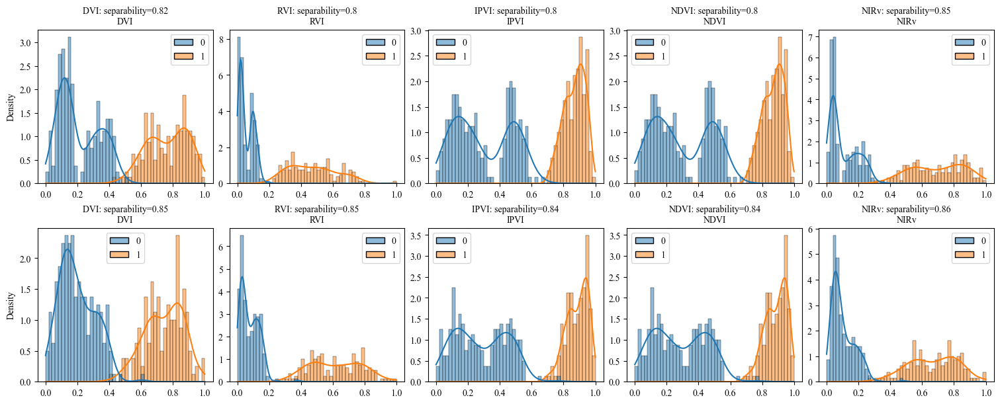

In [17]:
fig, axs = plt.subplots(2, len(vegetation_equation_names), figsize=(3*len(vegetation_equation_names), 6), constrained_layout=True)
sensor_types = ['landsat8', 'sentinel2']

for i, sensor_type in enumerate(sensor_types):
    data_df = pd.read_csv(f'./example_data/poyang_indices/{sensor_type}_vegetation.csv')
    X, y = data_df[bands].values, data_df['label'].values

    for j in range(len(vegetation_equation_names)):
        indice = calculate_spectral_index(data_df, vegetation_equations[j], bands)
        indice = (indice - indice.min()) / (indice.max() - indice.min())
        separability = directional_otsu_separability(indice, y)
        sns.histplot(x=indice, hue=y, kde=True, stat='density', bins=50, ax=axs[i, j])
        axs[i, j].set_title(f'{vegetation_equation_names[j]}: separability={round(separability, 2)}\n{vegetation_equation_names[j]}', fontsize=10)
        if j>0: axs[i, j].set_ylabel('')

### Water indices

In [18]:
water_equation_names = [
    'RWI', 'IWI', 'NDWI', 'MNDWI1', 'MNDWI2', 
]
water_equations = [
    'Blue / SWIR2', 'Green / (NIR + SWIR2)', 
    '(Green - NIR) / (Green + NIR)', '(Green - SWIR1) / (Green + SWIR1)', '(Green - SWIR2) / (Green + SWIR2)', 
]
water_equation_complexitys = [3, 5, 7, 7, 7]

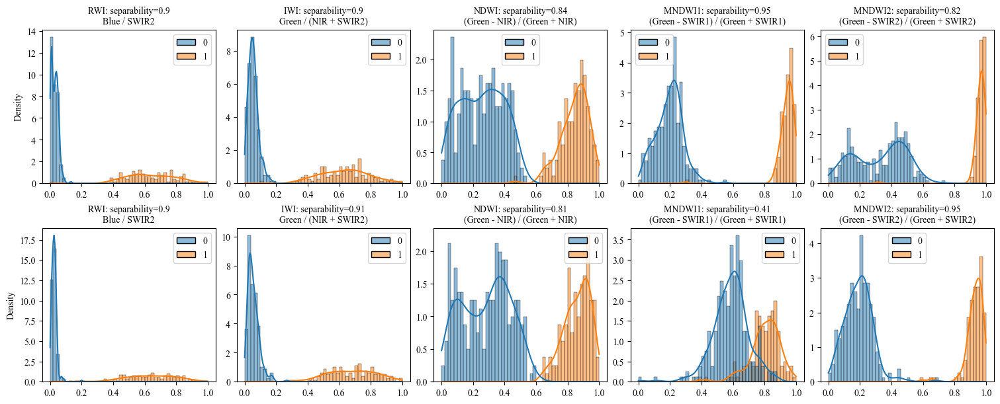

In [19]:
fig, axs = plt.subplots(2, len(water_equation_names), figsize=(3*len(water_equation_names), 6), constrained_layout=True)
sensor_types = ['landsat8', 'sentinel2']

for i, sensor_type in enumerate(sensor_types):
    data_df = pd.read_csv(f'./example_data/poyang_indices/{sensor_type}_water.csv')
    X, y = data_df[bands].values, data_df['label'].values

    for j in range(len(water_equation_names)):
        indice = calculate_spectral_index(data_df, water_equations[j], bands)
        indice = (indice - indice.min()) / (indice.max() - indice.min())
        separability = directional_otsu_separability(indice, y)
        sns.histplot(x=indice, hue=y, kde=True, stat='density', bins=50, ax=axs[i, j])
        axs[i, j].set_title(f'{water_equation_names[j]}: separability={round(separability, 2)}\n{water_equations[j]}', fontsize=10)
        if j>0: axs[i, j].set_ylabel('')

### Compare with existing spectral indices

In [20]:
landcover_types = ['vegetation', 'water']
sensor_types = ['landsat8', 'sentinel2']
sts = []

for i, landcover_type in enumerate(landcover_types):
    if landcover_type == 'water':
        bands = ['Blue', 'Green', 'Red', 'NIR', 'SWIR1', 'SWIR2']
    else:
        bands = ['Blue', 'Green', 'Red', 'NIR']
    for j, sensor_type in enumerate(sensor_types):
        data_df = pd.read_csv(f'./example_data/poyang_indices/{sensor_type}_{landcover_type}.csv')
        X, y = data_df[bands].values, data_df['label'].values
        st = SymbolicTransformer(
            maxsize=9, 
            niterations=10,
            populations=31,
            population_size=27,
            use_constant=False,
            metric='separability',
            ncycles_per_iteration=380,
            n_jobs=16, verbose=0, random_state=42
        )
        X_new = st.fit_transform(X, y, variable_names=bands)
        sts.append(st)

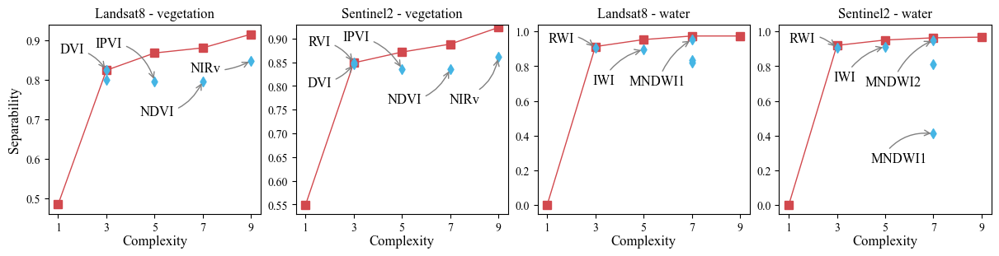

In [21]:
landcover_types = ['vegetation', 'water']
sensor_types = ['landsat8', 'sentinel2']
equation_names = [vegetation_equation_names, water_equation_names]
equations = [vegetation_equations, water_equations]
complexitys = [vegetation_equation_complexitys, water_equation_complexitys]

fig, axs = plt.subplots(1, 4, figsize=(12, 3), constrained_layout=True)

all_positions = []

for i, landcover_type in enumerate(landcover_types):
    for j, sensor_type in enumerate(sensor_types):
        data_df = pd.read_csv(f'./example_data/poyang_indices/{sensor_type}_{landcover_type}.csv')
        X, y = data_df[bands].values, data_df['label'].values
        st = sts[i * 2 + j]
        hof = st.get_hof()
        
        ax = axs[i * 2 + j]
        ax.plot(hof['complexity'], hof['error'], linewidth=1, marker='s', markersize=7, 
                color="#D2494E", markerfacecolor="#D2494E", markeredgecolor="#D2494E", zorder=1)
        ax.set_xlabel('Complexity', fontsize=12, labelpad=1)
        ax.set_ylabel('Separability', fontsize=12) if i==0 and j==0 else ax.set_ylabel('')
        ax.set_xticks(hof['complexity'])   
        # ax.set_ylim(0.5, 1.0) if i == 0 else ax.set_ylim(0.0, 1.0)
        if i == 0:
            ax.set_ylim(0.46, 0.94) if j==0 else ax.set_ylim(0.53, 0.93)
        else:
            ax.set_ylim(-0.05, 1.04)
        
        ax_positions = []
        for k in range(len(equation_names[i])):
            indice = calculate_spectral_index(data_df, equations[i][k], bands)
            indice = (indice - indice.min()) / (indice.max() - indice.min())
            separability = directional_otsu_separability(indice, y)
            ax.scatter(complexitys[i][k], separability, marker='d', color="#45B5E4", zorder=3)
            ax_positions.append([complexitys[i][k], separability])
            # ax.annotate(f'{equation_names[i][k]}', xy=(complexitys[i][k], separability), xytext=(-40, -10), textcoords="offset points", ha='center', fontsize=12, 
            #             arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=0.3", relpos=(0, 0.6)), zorder=4)
        all_positions += [ax_positions]

# Landsat8 - vegetation
axs[0].set_title('Landsat8 - vegetation')
axs[0].annotate(f'{equation_names[0][0]}', xy=(all_positions[0][0][0], all_positions[0][0][1]), xytext=(-30, 15), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=-0.3", relpos=(0, 0.6)), zorder=4);
axs[0].annotate(f'{equation_names[0][2]}', xy=(all_positions[0][2][0], all_positions[0][2][1]), xytext=(-40, 30), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=-0.4", relpos=(0, 0.6)), zorder=4);
axs[0].annotate(f'{equation_names[0][3]}', xy=(all_positions[0][3][0], all_positions[0][3][1]), xytext=(-40, -30), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=0.4", relpos=(0, 0.6)), zorder=4);
axs[0].annotate(f'{equation_names[0][4]}', xy=(all_positions[0][4][0], all_positions[0][4][1]), xytext=(-40, -10), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=0.2", relpos=(0, 0.6)), zorder=4);

# Sentinel2 - vegetation
axs[1].set_title('Sentinel2 - vegetation')
axs[1].annotate(f'{equation_names[0][0]}', xy=(all_positions[1][0][0], all_positions[1][0][1]), xytext=(-30, -20), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=0.3", relpos=(0, 0.6)), zorder=4);
axs[1].annotate(f'{equation_names[0][1]}', xy=(all_positions[1][1][0], all_positions[1][1][1]), xytext=(-30, 15), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=-0.3", relpos=(0, 0.6)), zorder=4);
axs[1].annotate(f'{equation_names[0][2]}', xy=(all_positions[1][2][0], all_positions[1][2][1]), xytext=(-40, 25), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=-0.3", relpos=(0, 0.6)), zorder=4);
axs[1].annotate(f'{equation_names[0][3]}', xy=(all_positions[1][3][0], all_positions[1][3][1]), xytext=(-40, -30), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=0.4", relpos=(0, 0.6)), zorder=4);
axs[1].annotate(f'{equation_names[0][4]}', xy=(all_positions[1][4][0], all_positions[1][4][1]), xytext=(-30, -40), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=0.4", relpos=(0, 0.6)), zorder=4);

# Landsat8 - water
axs[2].set_title('Landsat8 - water')
axs[2].annotate(f'{equation_names[1][0]}', xy=(all_positions[2][0][0], all_positions[2][0][1]), xytext=(-30, 5), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=-0.3", relpos=(0, 0.6)), zorder=4);
axs[2].annotate(f'{equation_names[1][1]}', xy=(all_positions[2][1][0], all_positions[2][1][1]), xytext=(-35, -30), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=-0.2", relpos=(0.5, 0.6)));
axs[2].annotate(f'{equation_names[1][3]}', xy=(all_positions[2][3][0], all_positions[2][3][1]), xytext=(-30, -40), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=-0.2", relpos=(0.5, 0.3)), zorder=4);

# Sentinel2 - water
axs[3].set_title('Sentinel2 - water')
axs[3].annotate(f'{equation_names[1][0]}', xy=(all_positions[3][0][0], all_positions[3][0][1]), xytext=(-30, 5), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=-0.3", relpos=(0, 0.6)), zorder=4);
axs[3].annotate(f'{equation_names[1][1]}', xy=(all_positions[3][1][0], all_positions[3][1][1]), xytext=(-35, -30), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=-0.2", relpos=(0.5, 0.6)));
axs[3].annotate(f'{equation_names[1][4]}', xy=(all_positions[3][4][0], all_positions[3][4][1]), xytext=(-35, -40), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=-0.2", relpos=(0.5, 0.6)), zorder=4);
axs[3].annotate(f'{equation_names[1][3]}', xy=(all_positions[3][3][0], all_positions[3][3][1]), xytext=(-30, -25), textcoords="offset points", ha='center', fontsize=12, 
                arrowprops=dict(arrowstyle="->", color='gray', connectionstyle="arc3,rad=-0.3", relpos=(0.2, 0.6)), zorder=4);

## Automatically threshold segmentation

In [9]:
bands = ['Blue', 'Green', 'Red', 'NIR', 'SWIR1', 'SWIR2']

In [10]:
class_labels = {
    0: 'Background',
    1: 'Bare land',
    2: 'Water',
    3: 'Vegetation', 
    4: 'Build-up area', 
    5: 'Class conflict'
}
colors = {
    0: '#F5F5F5',      # 背景 - 灰色
    1: '#D2B48C',   # 裸地 - 棕褐色 (tan)
    2: '#1F78B4',      # 水体 - 蓝色
    3: "#33A02C",      # 植被 - 绿色
    4: "#E31A1C",       # 建筑 - 
    5: '#00FFFF',     # class conflit
}

# 提取有序的颜色列表和标签列表
color_list = [colors[i] for i in sorted(colors.keys())]
label_list = [class_labels[i] for i in sorted(class_labels.keys())]

# 3. 创建自定义的颜色映射 (Colormap)
# ListedColormap会根据我们提供的颜色列表创建一个颜色映射
cmap = mcolors.ListedColormap(color_list)

# 4. 创建一个处理离散值的归一化规则 (BoundaryNorm)
# 我们有4个值 (0, 1, 2, 3, 4)，所以边界 (bounds) 需要6个点来定义4个区间
# [0, 1), [1, 2), [2, 3), [3, 4), [4, 5), [5, 6)
bounds = [0, 1, 2, 3, 4, 5, 6]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

In [11]:
colormaps = {
    1: mcolors.LinearSegmentedColormap.from_list('bare_land', ['white', '#D2B48C']),  # 裸地
    2: mcolors.LinearSegmentedColormap.from_list('water', ['white', '#1F78B4']),         # 水体
    3: mcolors.LinearSegmentedColormap.from_list('vegetation', ['white', '#33A02C']),   # 植被
    4: mcolors.LinearSegmentedColormap.from_list('built_up', ['white', '#E31A1C'])        # 建成区
}

### Jiujiang

#### Data loading

In [12]:
jiujiang_image = rio.open('./example_data/jiujiang_classification/Landsat8.tif')
jiujiang_image = jiujiang_image.read().transpose(1, 2, 0)[..., [1, 2, 3, 4, 5, 6]]
jiujiang_gt = rio.open('./example_data/jiujiang_classification/Landsat8_gt.tif')
jiujiang_gt = jiujiang_gt.read()[0, ...]
jiujiang_image.shape, jiujiang_gt.shape, np.count_nonzero(jiujiang_gt)

((529, 305, 6), (529, 305), 6694)

In [13]:
np.unique(jiujiang_gt)

array([0, 2, 3, 4], dtype=int16)

In [14]:
X_train_jiujiang = jiujiang_image.reshape(-1, jiujiang_image.shape[-1])
y_train_jiujiang = jiujiang_gt.reshape(-1)
X_train_jiujiang = X_train_jiujiang[y_train_jiujiang != 0, :]
y_train_jiujiang = y_train_jiujiang[y_train_jiujiang != 0]
X_train_jiujiang.shape, y_train_jiujiang.shape

((6694, 6), (6694,))

#### Symbolic Transformer

In [15]:
type_sts_jiujiang = []
for type_value in np.unique(y_train_jiujiang):
    st = SymbolicTransformer(
        maxsize=9, 
        niterations=10,
        populations=31,
        population_size=27,
        use_constant=False,
        metric='separability',
        ncycles_per_iteration=38,
        n_jobs=8, verbose=0, random_state=42
    )
    y_train_st = np.zeros(len(y_train_jiujiang))
    y_train_st[y_train_jiujiang == type_value] = 1
    st.fit(X_train_jiujiang, y_train_st, variable_names=bands)
    type_sts_jiujiang.append(st)

In [16]:
jiujiang_image_flatten = jiujiang_image.reshape(-1, jiujiang_image.shape[-1])
jiujiang_indices_st = np.zeros((jiujiang_image_flatten.shape[0], len(np.unique(y_train_jiujiang))))
for i, type_value in enumerate(np.unique(y_train_jiujiang)):
    best_expr = type_sts_jiujiang[i].get_best()['expression']
    jiujiang_indices_st[:, i] = best_expr.execute(jiujiang_image_flatten)
jiujiang_indices_st = clip_array_by_percentile(jiujiang_indices_st)
scaler = MinMaxScaler()
jiujiang_indices_st = scaler.fit_transform(jiujiang_indices_st)

In [17]:
jiujiang_confidence_st = np.zeros((jiujiang_image_flatten.shape[0], len(np.unique(y_train_jiujiang))))
jiujiang_predictions_st = np.zeros((jiujiang_image_flatten.shape[0], len(np.unique(y_train_jiujiang))))
for i, type_value in enumerate(np.unique(y_train_jiujiang)):
    threshold, mask = otsu_threshold(jiujiang_indices_st[:, i])
    jiujiang_predictions_st[mask, i] = type_value
    jiujiang_confidence_st[:, i] = (jiujiang_indices_st[:, i] - threshold) / (1 - threshold)

In [18]:
jiujiang_prediction_st = np.zeros((jiujiang_image_flatten.shape[0], ))
normal_classifed_mask = np.count_nonzero(jiujiang_predictions_st, axis=1) == 1
class_conflicted_mask = np.count_nonzero(jiujiang_predictions_st, axis=1) > 1
unclassified_mask = np.max(jiujiang_predictions_st, axis=1) == 0

jiujiang_prediction_st[normal_classifed_mask] = np.max(jiujiang_predictions_st, axis=1)[normal_classifed_mask]
jiujiang_prediction_st[class_conflicted_mask] = 5
jiujiang_prediction_st[unclassified_mask] = 5
np.unique(jiujiang_prediction_st)

array([2., 3., 4., 5.])

#### plotting

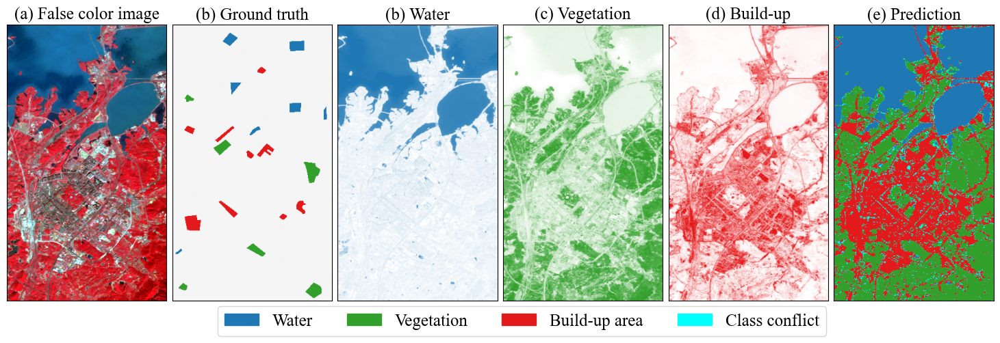

In [19]:
fig, axs = plt.subplots(1, 6, figsize=(14.5, 5), constrained_layout=True)

title_fontsize = 18
landcover_types = ['Water', 'Vegetation', 'Build-up']
axs[0].imshow(linear_stretch(jiujiang_image[..., [3, 2, 1]]))
axs[0].set_xticks([]), axs[0].set_yticks([])
axs[0].set_title(f'(a) False color image', fontsize=title_fontsize)
axs[1].imshow(jiujiang_gt, cmap=cmap, norm=norm)
axs[1].set_xticks([]), axs[1].set_yticks([])
axs[1].set_title(f'(b) Ground truth', fontsize=title_fontsize)
for i, (ax, type_value) in enumerate(zip(axs[2: -1], [2, 3, 4])):
    ax.imshow(jiujiang_indices_st[:, i].reshape(jiujiang_image.shape[:2]), cmap=colormaps[type_value])
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_title(f'({chr(98+i)}) {landcover_types[i]}', fontsize=title_fontsize)
axs[-1].imshow(jiujiang_prediction_st.reshape(jiujiang_image.shape[:2]), cmap=cmap, norm=norm)
axs[-1].set_xticks([]), axs[-1].set_yticks([])
axs[-1].set_title(f'(e) Prediction', fontsize=title_fontsize)

legend_patches = [Patch(color=colors[type_value], label=class_labels[type_value]) 
                    for type_value in np.unique(jiujiang_prediction_st)]

fig.legend(handles=legend_patches, bbox_to_anchor=(0.215, 0.08), ncols=5, loc='upper left', 
           borderaxespad=0., fontsize=title_fontsize);

### poyang

#### Data loading

In [20]:
poyang_image = rio.open('./example_data/poyang_classification/Landsat8.tif')
# poyang_image = poyang_image.read().transpose(1, 2, 0)[..., [1, 2, 3, 7, 10, 11]]
poyang_image = poyang_image.read().transpose(1, 2, 0)[..., [1, 2, 3, 4, 5, 6]]
poyang_gt = rio.open('./example_data/poyang_classification/Landsat8_gt.tif')
poyang_gt = poyang_gt.read()[0, ...]
poyang_image.shape, poyang_gt.shape, np.count_nonzero(poyang_gt)

((694, 395, 6), (694, 395), 5771)

In [21]:
X_train_poyang = poyang_image.reshape(-1, poyang_image.shape[-1])
y_train_poyang = poyang_gt.reshape(-1)
X_train_poyang = X_train_poyang[y_train_poyang != 0, :]
y_train_poyang = y_train_poyang[y_train_poyang != 0]
X_train_poyang.shape, y_train_poyang.shape

((5771, 6), (5771,))

#### Symbolic Transformer

In [22]:
type_sts_poyang = []
for type_value in np.unique(y_train_poyang):
    st = SymbolicTransformer(
        maxsize=9, 
        niterations=10,
        populations=31,
        population_size=27,
        use_constant=False,
        metric='separability',
        ncycles_per_iteration=38,
        n_jobs=8, verbose=0, random_state=42
    )
    y_train_st = np.zeros(len(y_train_poyang))
    y_train_st[y_train_poyang == type_value] = 1
    st.fit(X_train_poyang, y_train_st, variable_names=bands)
    type_sts_poyang.append(st)

In [23]:
poyang_image_flatten = poyang_image.reshape(-1, poyang_image.shape[-1])
poyang_indices_st = np.zeros((poyang_image_flatten.shape[0], len(np.unique(y_train_poyang))))
for i, type_value in enumerate(np.unique(y_train_poyang)):
    best_expr = type_sts_poyang[i].get_best()['expression']
    poyang_indices_st[:, i] = best_expr.execute(poyang_image_flatten)
poyang_indices_st = clip_array_by_percentile(poyang_indices_st)
scaler = MinMaxScaler()
poyang_indices_st = scaler.fit_transform(poyang_indices_st)

In [24]:
poyang_confidence_st = np.zeros((poyang_image_flatten.shape[0], len(np.unique(y_train_poyang))))
poyang_predictions_st = np.zeros((poyang_image_flatten.shape[0], len(np.unique(y_train_poyang))))
for i, type_value in enumerate(np.unique(y_train_poyang)):
    threshold, mask = otsu_threshold(poyang_indices_st[:, i])
    poyang_predictions_st[mask, i] = type_value
    poyang_confidence_st[:, i] = (poyang_indices_st[:, i] - threshold) / (1 - threshold)

In [25]:
poyang_prediction_st = np.zeros((poyang_image_flatten.shape[0], ))
normal_classifed_mask = np.count_nonzero(poyang_predictions_st, axis=1) == 1
class_conflicted_mask = np.count_nonzero(poyang_predictions_st, axis=1) > 1
unclassified_mask = np.max(poyang_predictions_st, axis=1) == 0

poyang_prediction_st[normal_classifed_mask] = np.max(poyang_predictions_st, axis=1)[normal_classifed_mask]
poyang_prediction_st[class_conflicted_mask] = 5
poyang_prediction_st[unclassified_mask] = 5
np.unique(poyang_prediction_st)

array([1., 2., 3., 5.])

#### plotting

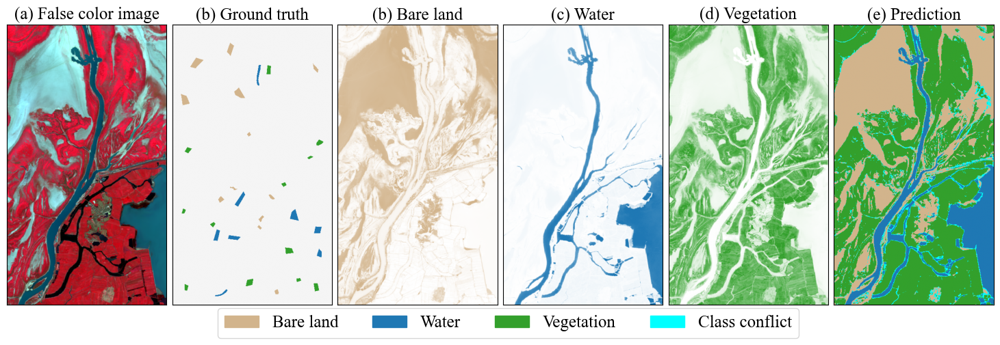

In [26]:
fig, axs = plt.subplots(1, 6, figsize=(14.5, 5), constrained_layout=True)

title_fontsize = 18
landcover_types = ['Bare land', 'Water', 'Vegetation']
axs[0].imshow(linear_stretch(poyang_image[..., [3, 2, 1]]))
axs[0].set_xticks([]), axs[0].set_yticks([])
axs[0].set_title(f'(a) False color image', fontsize=title_fontsize)
axs[1].imshow(poyang_gt, cmap=cmap, norm=norm)
axs[1].set_xticks([]), axs[1].set_yticks([])
axs[1].set_title(f'(b) Ground truth', fontsize=title_fontsize)
for i, (ax, type_value) in enumerate(zip(axs[2: -1], [1, 2, 3])):
    ax.imshow(poyang_indices_st[:, i].reshape(poyang_image.shape[:2]), cmap=colormaps[type_value])
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_title(f'({chr(98+i)}) {landcover_types[i]}', fontsize=title_fontsize)
axs[-1].imshow(poyang_prediction_st.reshape(poyang_image.shape[:2]), cmap=cmap, norm=norm)
axs[-1].set_xticks([]), axs[-1].set_yticks([])
axs[-1].set_title(f'(e) Prediction', fontsize=title_fontsize)

legend_patches = [Patch(color=colors[type_value], label=class_labels[type_value]) for type_value in np.unique(poyang_prediction_st)]

fig.legend(handles=legend_patches, bbox_to_anchor=(0.215, 0.08), ncols=5, loc='upper left', 
           borderaxespad=0., fontsize=title_fontsize);

### Combined plotting

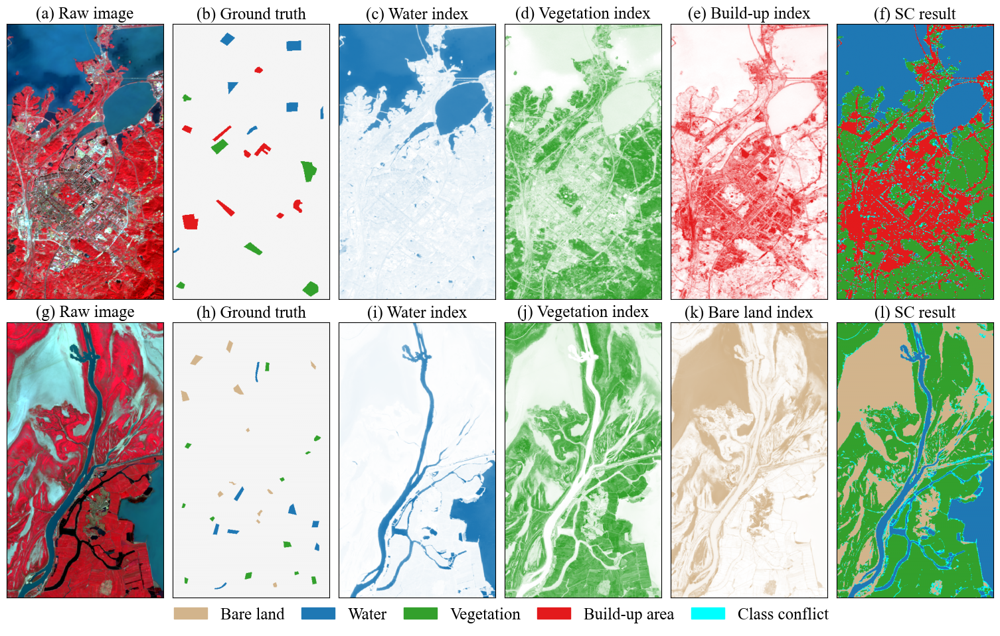

In [27]:
landcover_types = ['Water index', 'Vegetation index', 'Build-up index']
fig, axs = plt.subplots(2, 6, figsize=(15, 9), constrained_layout=True)

title_fontsize = 18

axs[0, 0].imshow(linear_stretch(jiujiang_image[..., [3, 2, 1]])[:, 5:, ...])
axs[0, 0].set_xticks([]), axs[0, 0].set_yticks([])
axs[0, 0].set_title(f'(a) Raw image', fontsize=title_fontsize)
axs[0, 1].imshow(jiujiang_gt[:, 5:], cmap=cmap, norm=norm)
axs[0, 1].set_xticks([]), axs[0, 1].set_yticks([])
axs[0, 1].set_title(f'(b) Ground truth', fontsize=title_fontsize)
for i, (label, ax) in enumerate(zip([2, 3, 4], axs[0, 2: -1])):
    ax.imshow(jiujiang_indices_st[:, i].reshape(jiujiang_image.shape[:2])[:, 5:], cmap=colormaps[label])
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_title(f'({chr(97+label)}) {landcover_types[label-2]}', fontsize=title_fontsize)
axs[0, -1].imshow(jiujiang_prediction_st.reshape(jiujiang_image.shape[:2])[:, 5:], cmap=cmap, norm=norm)
axs[0, -1].set_xticks([]), axs[0, -1].set_yticks([])
axs[0, -1].set_title(f'(f) SC result', fontsize=title_fontsize)


landcover_types = ['Bare land index', 'Water index', 'Vegetation index']
axs[1, 0].imshow(linear_stretch(poyang_image[..., [3, 2, 1]]))
axs[1, 0].set_xticks([]), axs[1, 0].set_yticks([])
axs[1, 0].set_title(f'(g) Raw image', fontsize=title_fontsize)
axs[1, 1].imshow(poyang_gt, cmap=cmap, norm=norm)
axs[1, 1].set_xticks([]), axs[1, 1].set_yticks([])
axs[1, 1].set_title(f'(h) Ground truth', fontsize=title_fontsize)
for i, (label, ax) in enumerate(zip([2, 3, 1], axs[1, 2: -1])):
    ax.imshow(poyang_indices_st[:, [1, 2, 0]][:, i].reshape(poyang_image.shape[:2]), cmap=colormaps[label])
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_title(f'({chr(105+i)}) {landcover_types[label-1]}', fontsize=title_fontsize)
axs[1, -1].imshow(poyang_prediction_st.reshape(poyang_image.shape[:2]), cmap=cmap, norm=norm)
axs[1, -1].set_xticks([]), axs[1, -1].set_yticks([])
axs[1, -1].set_title(f'(l) SC result', fontsize=title_fontsize)


# 为每个类别创建一个 Patch (颜色块)
legend_patches = [Patch(color=colors[type_value], label=class_labels[type_value]) 
                    for type_value in set(list(jiujiang_prediction_st)+list(poyang_prediction_st))]

# 将图例添加到图上
fig.legend(handles=legend_patches, bbox_to_anchor=(0.166, 0.0), ncols=5, loc='upper left', 
           borderaxespad=0., columnspacing=1., fontsize=18, frameon=False);

# Symbolic Classification

## Single Expression for binary classification

In [28]:
# Prepare data
X, y = make_classification(n_samples=150, n_features=4, n_informative=2, n_redundant=0, random_state=42)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [29]:
# Initialize and train the model
# The classifier will evolve a set of expressions, one for each class.
sc = SymbolicClassifier(
    maxsize=21, 
    niterations=5,
    populations=31,
    population_size=27,
    use_constant=True,
    out_func='sigmoid',
    verbose=1, n_jobs=8, random_state=42
)
sc.fit(X_train, y_train)

      |     Population Average     |      Best Individual       |            Progress            
------|----------------------------|----------------------------|---------------------------------
 Iter |  Complexity          Error |  Complexity          Error |      Time Left        Time Used
    1 |       16.01       0.764075 |          21       0.175197 |            16s               4s
    2 |       17.94       0.613549 |          21       0.174559 |            13s               8s
    3 |       17.72       0.612263 |          21       0.155063 |            10s              13s
    4 |       18.25       0.749633 |          21       0.143451 |             4s              18s
    5 |       18.73       0.683808 |          21       0.143165 |             0s              23s


SymbolicClassifier.equations_ = [
    pick    score     expression                                                            loss        complexity
0           1         x3                                                                    0.362236    0.000000  
1           3         (x3 * 3.6015936)                                                      0.216531    0.257281  
2           5         ((4.3023929 - x3) * x3)                                               0.199522    0.040906  
3           7         ((x0 + (4.7198766 - x3)) * x3)                                        0.194217    0.013474  
4           9         ((x3 * (4.172046 - x3)) + (x1 / 3.9999932))                           0.193289    0.002395  
5           11        ((x3 * (4.7850736 - x3)) + ((x1 / x3) / -5.4050269))                  0.186299    0.018415  
6           13        (((x1 / x3) / -5.4050269) + ((4.7850736 - (x3 - x0)) * x3))           0.178122    0.022444  
7           15        ((((x1 / x3) - x1) / -5.4050269) + ((4.7850736 - (x3 - x0)) * x3))    0.172433    0.016229  
8           17        ((((x1 / x3) / (-2.8476885 - x1)) + (x3 * (5.0184393 - (x3 - x0)))) + x1)0.164368    0.023951  
9           19        (((4.7680371 - x3) * x3) + (-0.7475777 / ((x2 / ((x1 - x3) * (x0 * x1))) + -4.6427333)))0.159265    0.015770  
10  >>>>    21        (2.9253137 * (x3 - ((((x2 - x1) * x1) / (x3 * (x2 + ((0.5835396 * x3) * x3)))) / 7.6415768)))0.143165    0.053284  
]

In [30]:
sc.score(X_test, y_test)

0.7666666666666667

## Expression set for multiclass classification

### Simulated data

In [31]:
from sklearn import datasets
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons, make_circles, make_classification

In [32]:
n_samples = 150

moons = make_moons(n_samples=n_samples, noise=0.2, random_state=0)
circles = make_circles(n_samples=n_samples, noise=0.2, factor=0.5, random_state=1)
blobs = datasets.make_blobs(
    n_samples=n_samples, 
    centers=[[-2.0, -1.5], [2.5, 2.5]], 
    cluster_std=[0.8, 2.0], 
    random_state=0
)
shifted_circle = make_shifted_circle(
    n_samples=n_samples, 
    shift=0.2, 
    cut_angle=150, 
    noise=0.0, 
    random_state=0
)
xor = make_xor(n_samples=n_samples, noise=0.005, box_size=2.0, random_state=0)
taichi = make_taichi(n_samples=n_samples, noise=0.1, random_state=1)

datas = [
    blobs, shifted_circle, xor, moons, circles, taichi
]

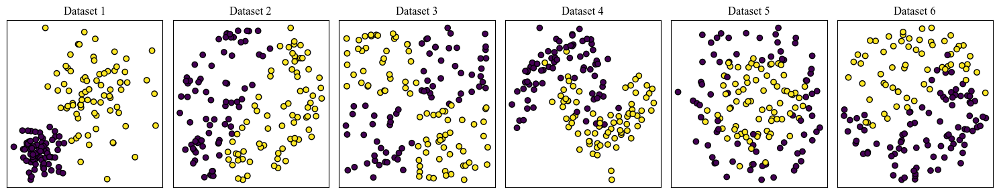

In [33]:
fig, axes = plt.subplots(1, 6, figsize=(15, 3))
for idx, (X, y) in enumerate(datas):
    ax = axes.ravel()[idx]
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', edgecolors='k')
    ax.set_title(f'Dataset {idx+1}')
    ax.set_xticks(()), ax.set_yticks(())
plt.tight_layout()
plt.show()

### Compare with others

In [34]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression

In [35]:
names = ["kNN", "DT", "LR", "NB", "SVM", "RF", "XGB", "LGBM", "MLP", "SC"]

classifiers = [
    KNeighborsClassifier(3),
    DecisionTreeClassifier(max_depth=5, random_state=42),
    LogisticRegression(verbose=0, random_state=42), 
    GaussianNB(),
    SVC(gamma=2, C=1, random_state=42),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1, random_state=42),
    XGBClassifier(eval_metric='mlogloss', n_jobs=4, random_state=42),
    LGBMClassifier(verbose=-1, n_jobs=4, random_state=42), 
    MLPClassifier(alpha=1, max_iter=1000, random_state=42, hidden_layer_sizes=(64, 128, 64)),
    SymbolicClassifier(
        maxsize=9, 
        niterations=10,
        populations=31,
        population_size=27,
        use_constant=True,
        stopping_criteria=0.01,
        ncycles_per_iteration=380,
        operators=('+', '-', '*', '/'),
        verbose=0, n_jobs=16, random_state=42,
        metric='focal_loss', out_func='softmax'
    )
]

In [36]:
import copy
from tqdm.notebook import tqdm


data_trained_classifiers = {}
pbar = tqdm(total=len(datas) * len(classifiers), desc=f"Processing Models")
for i, data in enumerate(datas):
    X, y = data
    X = StandardScaler().fit_transform(X)
    X_train, X_test, y_train, y_test = \
        train_test_split(X, y, test_size=.2, random_state=42)
    
    # iterate over classifiers
    classifier_results = {}
    for j, (name, clf) in enumerate(zip(names, classifiers), 1):
        pbar.set_postfix_str(f"Tuning {name} on dataset {i+1}...")
        clf = copy.deepcopy(clf)
        clf.fit(X_train, y_train)
        classifier_results[j] = clf
        pbar.update(1)
    data_trained_classifiers[i] = classifier_results
pbar.close()

Processing Models:   0%|          | 0/60 [00:00<?, ?it/s]

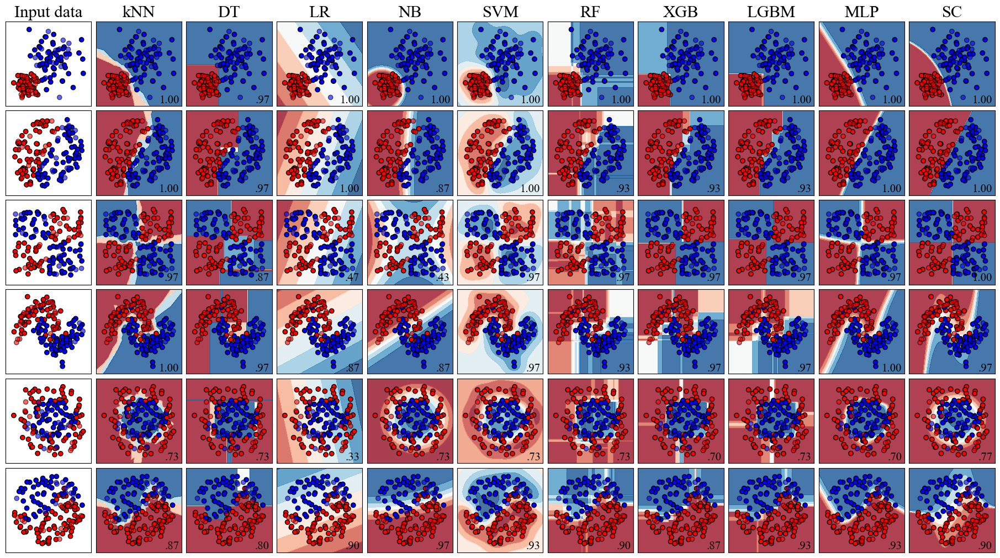

In [37]:
# Modified from https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html
# Code source: Gaël Varoquaux
#              Andreas Müller
# License: BSD 3 clause

import warnings
warnings.filterwarnings("ignore", category=UserWarning, message="X does not have valid feature names")


fig, axs = plt.subplots(len(datas), len(classifiers)+1, figsize=(18, 10), constrained_layout=True)
h = .02  # step size in the 
title_fontsize = 22

for i, data in enumerate(datas):
    X, y = data
    X = StandardScaler().fit_transform(X)
    X_train, X_test, y_train, y_test = \
        train_test_split(X, y, test_size=.2, random_state=42)
    
    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    image = np.c_[xx.ravel(), yy.ravel()]
    
    ax = axs[i, 0]
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])
    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, edgecolors='k')
    # Plot the testing points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6, edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xticks(()), ax.set_yticks(())
    ax.set_title("Input data", fontsize=title_fontsize) if i == 0 else None
    
    # iterate over classifiers
    for j, name in enumerate(names, 1):
        ax = axs[i, j]
        clf = data_trained_classifiers[i][j]
        score = clf.score(X_test, y_test)
        # Plot the decision boundary. For that, we will assign a color to each
        # point in the mesh [x_min, x_max]x[y_min, y_max].
        if hasattr(clf, "decision_function"):
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
        
        # Put the result into a color plot
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=.8)
        # ax.contour(xx, yy, Z, alpha=.8, levels=[0.5], linewidths=1, colors='black')
        
        # Plot the training points
        ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, edgecolors='k')
        # Plot the testing points
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, edgecolors='k', alpha=0.6)

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(()), ax.set_yticks(())
        ax.set_title(name, fontsize=title_fontsize) if i == 0 else None
        ax.text(xx.max() - .15, yy.min() + .2, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')

## Multispectal dataset classification

In [38]:
bands = ['Blue', 'Green', 'Red', 'NIR', 'SWIR1', 'SWIR2']

In [39]:
class_labels = {
    0: 'Background',
    1: 'Bare land',
    2: 'Water',
    3: 'Vegetation', 
    4: 'Build-up area'
}
colors = {
    0: '#F5F5F5',      # 背景 - 灰色
    1: '#D2B48C',   # 裸地 - 棕褐色 (tan)
    2: '#1F78B4',      # 水体 - 蓝色
    3: '#33A02C',      # 植被 - 绿色
    4: '#E31A1C'
}

# 提取有序的颜色列表和标签列表
color_list = [colors[i] for i in sorted(colors.keys())]
label_list = [class_labels[i] for i in sorted(class_labels.keys())]

# 3. 创建自定义的颜色映射 (Colormap)
# ListedColormap会根据我们提供的颜色列表创建一个颜色映射
cmap = mcolors.ListedColormap(color_list)

# 4. 创建一个处理离散值的归一化规则 (BoundaryNorm)
# 我们有4个值 (0, 1, 2, 3, 4)，所以边界 (bounds) 需要6个点来定义4个区间
# [0, 1), [1, 2), [2, 3), [3, 4), [4, 5)
bounds = [0, 1, 2, 3, 4, 5]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

In [40]:
colormaps = {
    1: mcolors.LinearSegmentedColormap.from_list('bare_land', ['white', '#D2B48C']),  # 裸地
    2: mcolors.LinearSegmentedColormap.from_list('water', ['white', '#1F78B4']),      # 水体
    3: mcolors.LinearSegmentedColormap.from_list('vegetation', ['white', '#33A02C']), # 植被
    4: mcolors.LinearSegmentedColormap.from_list('built_up', ['white', '#E31A1C'])    # 建成区
}

### Jiujiang

#### Data loading

In [41]:
jiujiang_image = rio.open('./example_data/jiujiang_classification/Landsat8.tif')
jiujiang_image = jiujiang_image.read().transpose(1, 2, 0)[..., [1, 2, 3, 4, 5, 6]]
jiujiang_gt = rio.open('./example_data/jiujiang_classification/Landsat8_gt.tif')
jiujiang_gt = jiujiang_gt.read()[0, ...]
jiujiang_image.shape, jiujiang_gt.shape, np.count_nonzero(jiujiang_gt)

((529, 305, 6), (529, 305), 6694)

In [42]:
np.unique(jiujiang_gt)

array([0, 2, 3, 4], dtype=int16)

In [43]:
X_train = jiujiang_image.reshape(-1, jiujiang_image.shape[-1])
y_train = jiujiang_gt.reshape(-1)
X_train = X_train[y_train != 0, :]
y_train = y_train[y_train != 0]
X_train.shape, y_train.shape

((6694, 6), (6694,))

#### Symbolic Classifier

In [44]:
sc_jiujiang = SymbolicClassifier(
    maxsize=9, 
    niterations=10,
    populations=31,
    population_size=27,
    use_constant=False,
    use_variable=True,
    ncycles_per_iteration=38,
    should_optimize_aggregations=False,
    n_jobs=8, verbose=1, random_state=42, 
    metric='hinge_loss', out_func='identity'
)
sc_jiujiang.fit(X_train, y_train, variable_names=bands)

      |         Population Average          |           Best Individual           |            Progress            
------|-------------------------------------|-------------------------------------|---------------------------------
 Iter |  Order   Complexity           Error |  Order   Complexity           Error |      Time Left        Time Used
    1 |   3.00        23.45         3.42028 |      3           27        0.217219 |             6s               0s
    2 |   3.00        23.99         16.0977 |      3           27       0.0103119 |             5s               1s
    3 |   3.00        24.21         5.39446 |      3           27       0.0102661 |             7s               2s
    4 |   3.00        24.58         2.84088 |      3           27      0.00970898 |             4s               3s
    5 |   3.00        24.59         9.51252 |      3           23      0.00766232 |             4s               4s
    6 |   3.00        22.00          139.08 |      3           23      

SymbolicClassifier.equations_ = [
    pick    score     expression set                                                        loss        complexity
0           3       3         [Blue; NIR; SWIR2]                                                    0.896823    0.000000  
1           3       7         [NIR; (SWIR2 / Green); (SWIR2 / Green)]                               0.660820    0.076344  
2           3       9         [(((Blue - SWIR2) / SWIR1) / Green); 0.0; Blue]                       0.354234    0.311761  
3           3       13        [((Blue - SWIR2) / Green); 0.0; (((SWIR2 + SWIR2) - NIR) / Blue)]     0.168258    0.186115  
4           3       15        [(((Blue - SWIR2) / SWIR1) / Red); 0.0; (((SWIR2 + SWIR2) - NIR) / Blue)]0.006133    1.655906  
5           3       17        [(((Blue - SWIR2) / SWIR2) / Green); (0.0 - NIR); ((SWIR2 + (SWIR2 - NIR)) / Blue)]0.004319    0.175274  
6           3       19        [(((Blue - SWIR2) / SWIR2) / Green); (0.0 - NIR); (((SWIR2 + (SWIR2 - NIR)) / Blue) + Red)]0.003818    0.061678  
7           3       21        [((((Blue - SWIR2) / Green) / Red) - Green); (SWIR1 - (Red / SWIR1)); ((SWIR2 + (SWIR2 - NIR)) / Blue)]0.003032    0.115201  
8   >>>>    3       25        [(((Blue - SWIR2) / SWIR1) / Green); (Green - (Red / ((SWIR1 * SWIR1) + Blue))); ((((SWIR2 + Green) - NIR) / Blue) + Blue)]0.002040    0.099048  
]

In [45]:
sc_jiujiang.score(X_train, y_train)

0.9991036749327756

In [46]:
jiujiang_image_flatten = jiujiang_image.reshape(-1, jiujiang_image.shape[-1])
best_expr = sc_jiujiang.get_best()['expression']
# jiujiang_indices = best_expr.execute(jiujiang_image_flatten)
jiujiang_indices = sc_jiujiang.predict_proba(jiujiang_image_flatten)

In [47]:
jiujiang_predictions = sc_jiujiang.predict(jiujiang_image_flatten)
jiujiang_predictions.shape

(161345,)

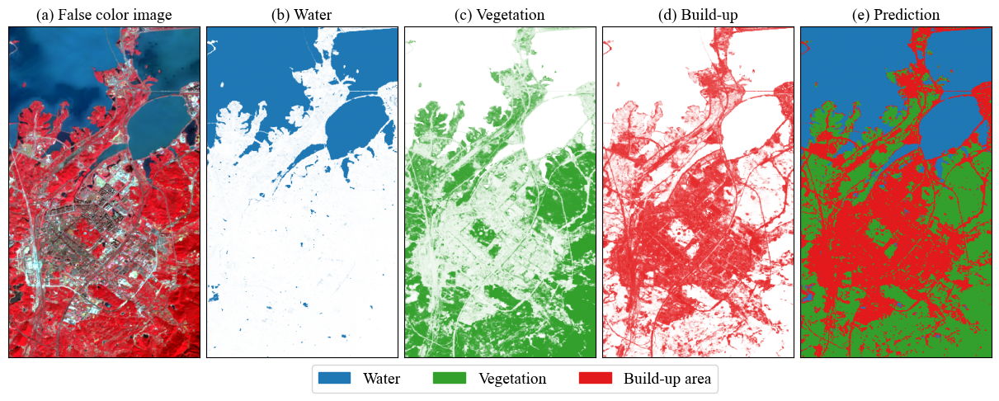

In [48]:
landcover_types = ['Water', 'Vegetation', 'Build-up']

fig, axs = plt.subplots(1, 5, figsize=(12, 5), constrained_layout=True)
axs[0].imshow(linear_stretch(jiujiang_image[..., [3, 2, 1]]))
axs[0].set_xticks([]), axs[0].set_yticks([])
axs[0].set_title(f'(a) False color image', fontsize=14)
for i, ax in enumerate(axs[1: -1]):
    ax.imshow(jiujiang_indices[:, i].reshape(jiujiang_image.shape[:2]), cmap=colormaps[i+2])
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_title(f'({chr(98+i)}) {landcover_types[i]}', fontsize=14)
axs[-1].imshow(jiujiang_predictions.reshape(jiujiang_image.shape[:2]), cmap=cmap, norm=norm)
axs[-1].set_xticks([]), axs[-1].set_yticks([])
axs[-1].set_title(f'(e) Prediction', fontsize=14)

legend_patches = [Patch(color=color_list[i], label=label_list[i])
                  for i in [2, 3, 4]]
fig.legend(handles=legend_patches, bbox_to_anchor=(0.31, 0.08), ncols=3, loc='upper left', 
           borderaxespad=0., fontsize=14);

### Poyang

#### Data loading

In [49]:
poyang_image = rio.open('./example_data/poyang_classification/Landsat8.tif')
# poyang_image = poyang_image.read().transpose(1, 2, 0)[..., [1, 2, 3, 7, 10, 11]]
poyang_image = poyang_image.read().transpose(1, 2, 0)[..., [1, 2, 3, 4, 5, 6]]
poyang_gt = rio.open('./example_data/poyang_classification/Landsat8_gt.tif')
poyang_gt = poyang_gt.read()[0, ...]
poyang_image.shape, poyang_gt.shape, np.count_nonzero(poyang_gt)

((694, 395, 6), (694, 395), 5771)

In [50]:
X_train = poyang_image.reshape(-1, poyang_image.shape[-1])
y_train = poyang_gt.reshape(-1)
X_train = X_train[y_train != 0, :]
y_train = y_train[y_train != 0]
X_train.shape, y_train.shape

((5771, 6), (5771,))

#### Symbolic Classifier

In [51]:
sc_poyang = SymbolicClassifier(
    maxsize=9, 
    niterations=10,
    populations=31,
    population_size=27,
    use_constant=False,
    use_variable=True,
    ncycles_per_iteration=38,
    should_optimize_aggregations=False,
    n_jobs=8, verbose=1, random_state=42, 
    metric='hinge_loss', out_func='identity'
)
sc_poyang.fit(X_train, y_train, variable_names=bands)

      |         Population Average          |           Best Individual           |            Progress            
------|-------------------------------------|-------------------------------------|---------------------------------
 Iter |  Order   Complexity           Error |  Order   Complexity           Error |      Time Left        Time Used
    1 |   3.00        23.94         2.63096 |      3           19       0.0111795 |             6s               0s
    2 |   3.00        24.07         2.12166 |      3           25       0.0109486 |            11s               2s
    3 |   3.00        23.79         1.14085 |      3           19      0.00808386 |             4s               2s
    4 |   3.00        24.24         1.23957 |      3           21      0.00666221 |             5s               3s
    5 |   3.00        24.16         4.92205 |      3           27      0.00588318 |             4s               4s
    6 |   3.00        22.98         14.5544 |      3           25      

SymbolicClassifier.equations_ = [
    pick    score     expression set                                                        loss        complexity
0           3       3         [SWIR2; Green; NIR]                                                   0.864599    0.000000  
1           3       7         [(SWIR1 + SWIR1); 0.0; (Blue * Green)]                                0.817587    0.013977  
2           3       9         [(Red / (Green - Blue)); (Red / SWIR1); 3.0]                          0.025558    1.732700  
3           3       11        [(Red / (Green - Blue)); (SWIR2 + (Red / SWIR2)); 3.0]                0.018495    0.161741  
4           3       15        [(Red / (Green - Blue)); (Green / SWIR1); ((NIR + (SWIR1 / SWIR2)) + 1.0)]0.007478    0.226370  
5           3       17        [(SWIR2 + (Red / (Green - Blue))); (Blue + ((Green / SWIR2) + 1.0)); (NIR / Green)]0.002107    0.633363  
6   >>>>    3       23        [(SWIR2 + (Red / (Green - Blue))); (Blue + ((Green / SWIR2) + 1.0)); ((NIR - ((NIR * NIR) - Green)) / Green)]0.001967    0.011425  
]

In [52]:
sc_poyang.score(X_train, y_train)

0.9996534396118524

In [53]:
poyang_image_flatten = poyang_image.reshape(-1, poyang_image.shape[-1])
best_expr = sc_poyang.get_best(5)['expression']
best_expr = best_expr.copy()
# best_expr.out_func = None
# poyang_indices = best_expr.execute(poyang_image_flatten)
poyang_indices = sc_poyang.predict_proba(poyang_image_flatten)
# poyang_indices = clip_array_by_percentile(poyang_indices)

In [54]:
train_indices = best_expr.execute(X_train)
train_indices = clip_array_by_percentile(train_indices)
train_indices.shape

(5771, 3)

In [55]:
poyang_predictions = sc_poyang.predict(poyang_image_flatten)
poyang_predictions = poyang_predictions.reshape(poyang_image.shape[:2])
poyang_predictions.shape

(694, 395)

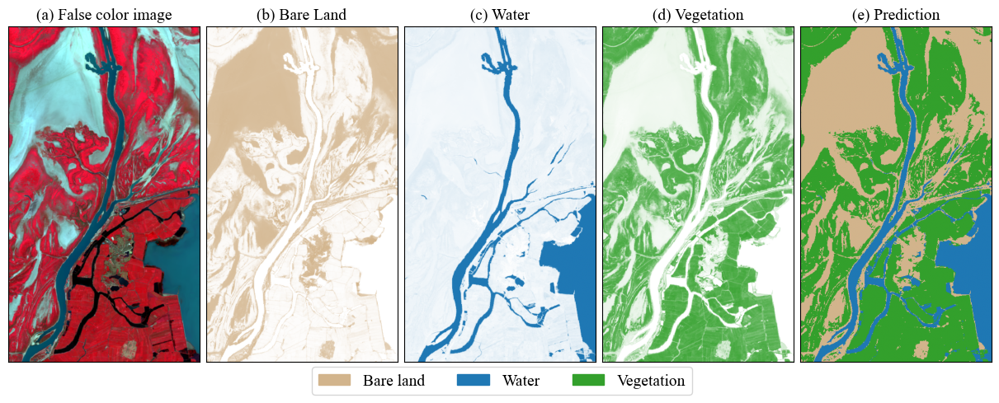

In [56]:
landcover_types = ['Bare Land', 'Water', 'Vegetation']

fig, axs = plt.subplots(1, 5, figsize=(12, 5), constrained_layout=True)
axs[0].imshow(linear_stretch(poyang_image[..., [3, 2, 1]]))
axs[0].set_xticks([]), axs[0].set_yticks([])
axs[0].set_title(f'(a) False color image', fontsize=14)
for i, ax in enumerate(axs[1: -1]):
    ax.imshow(poyang_indices[:, i].reshape(poyang_image.shape[:2]), 
              vmin=np.min(poyang_indices), vmax=np.max(poyang_indices), cmap=colormaps[i+1])
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_title(f'({chr(98+i)}) {landcover_types[i]}', fontsize=14)
axs[-1].imshow(poyang_predictions, cmap=cmap, norm=norm)
axs[-1].set_xticks([]), axs[-1].set_yticks([])
axs[-1].set_title(f'(e) Prediction', fontsize=14)

legend_patches = [Patch(color=color_list[i], label=label_list[i])
                  for i in [1, 2, 3]]
fig.legend(handles=legend_patches, bbox_to_anchor=(0.31, 0.08), ncols=3, loc='upper left', 
           borderaxespad=0., fontsize=14);

### Combined plotting

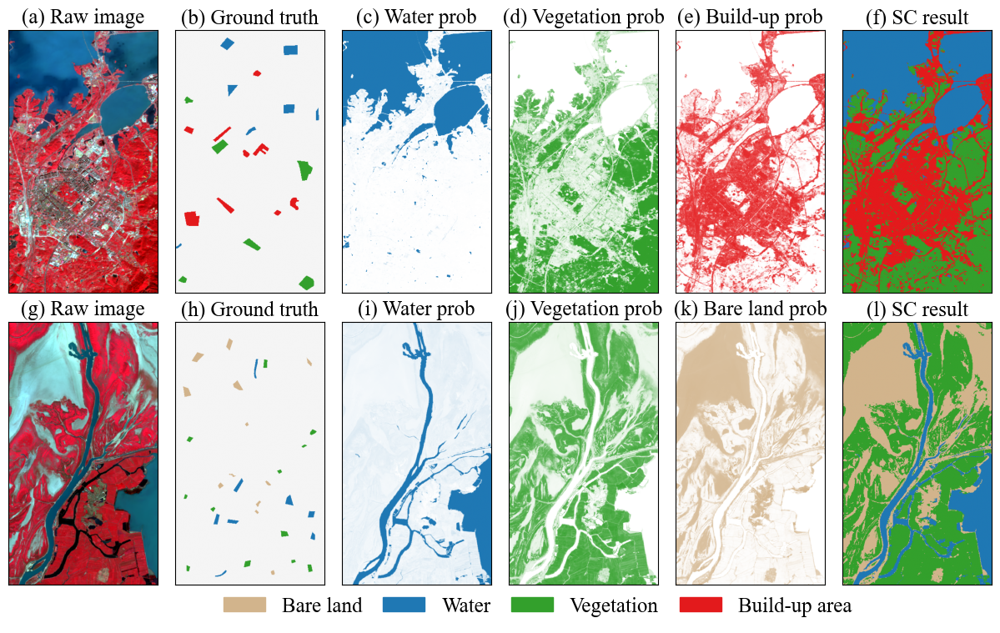

In [57]:
landcover_types = ['Water prob map', 'Vegetation prob map', 'Build-up prob map']
landcover_types = ['Water prob', 'Vegetation prob', 'Build-up prob']
fig, axs = plt.subplots(2, 6, figsize=(12, 7), constrained_layout=True)

title_fontsize = 18

axs[0, 0].imshow(linear_stretch(jiujiang_image[..., [3, 2, 1]])[:, 5:, ...])
axs[0, 0].set_xticks([]), axs[0, 0].set_yticks([])
axs[0, 0].set_title(f'(a) Raw image', fontsize=title_fontsize)
axs[0, 1].imshow(jiujiang_gt[:, 5:], cmap=cmap, norm=norm)
axs[0, 1].set_xticks([]), axs[0, 1].set_yticks([])
axs[0, 1].set_title(f'(b) Ground truth', fontsize=title_fontsize)
for i, (label, ax) in enumerate(zip([2, 3, 4], axs[0, 2: -1])):
    ax.imshow(jiujiang_indices[:, i].reshape(jiujiang_image.shape[:2])[:, 5:], cmap=colormaps[label])
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_title(f'({chr(97+label)}) {landcover_types[label-2]}', fontsize=title_fontsize)
axs[0, -1].imshow(jiujiang_predictions.reshape(jiujiang_image.shape[:2])[:, 5:], cmap=cmap, norm=norm)
axs[0, -1].set_xticks([]), axs[0, -1].set_yticks([])
axs[0, -1].set_title(f'(f) SC result', fontsize=title_fontsize)


landcover_types = ['Bare land prob map', 'Water prob map', 'Vegetation prob map']
landcover_types = ['Bare land prob', 'Water prob', 'Vegetation prob']
axs[1, 0].imshow(linear_stretch(poyang_image[..., [3, 2, 1]]))
axs[1, 0].set_xticks([]), axs[1, 0].set_yticks([])
axs[1, 0].set_title(f'(g) Raw image', fontsize=title_fontsize)
axs[1, 1].imshow(poyang_gt, cmap=cmap, norm=norm)
axs[1, 1].set_xticks([]), axs[1, 1].set_yticks([])
axs[1, 1].set_title(f'(h) Ground truth', fontsize=title_fontsize)
for i, (label, ax) in enumerate(zip([2, 3, 1], axs[1, 2: -1])):
    ax.imshow(poyang_indices[:, [1, 2, 0]][:, i].reshape(poyang_image.shape[:2]), cmap=colormaps[label])
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_title(f'({chr(105+i)}) {landcover_types[label-1]}', fontsize=title_fontsize)
axs[1, -1].imshow(poyang_predictions.reshape(poyang_image.shape[:2]), cmap=cmap, norm=norm)
axs[1, -1].set_xticks([]), axs[1, -1].set_yticks([])
axs[1, -1].set_title(f'(l) SC result', fontsize=title_fontsize)


# 创建一个图例来代替传统的 colorbar，这样更适合分类数据
# 为每个类别创建一个 Patch (颜色块)
legend_patches = [Patch(color=color_list[i], label=label_list[i])
                  for i in range(1, len(label_list))]

# 将图例添加到图上
fig.legend(handles=legend_patches, bbox_to_anchor=(0.215, 0.0), ncols=4, loc='upper left', 
           borderaxespad=0., columnspacing=1., fontsize=18, frameon=False);

## Hyperspectral dataset classification

In [58]:
from scipy.io import loadmat

In [69]:
datasets_info = {
    'Pavia University': ['PaviaU', 'paviaU', 'PaviaU_gt', 'paviaU_gt', (610, 340, 103), 9]
}

def load_dataset(dataset_name: str, if_std=True):
    """Loads hyperspectral data and conditionally applies standard scaling to valid pixels."""
    info = datasets_info[dataset_name]
    
    # Load raw image and ground truth
    img_dict = loadmat(f'./example_data/hyperspectral/{dataset_name}/{info[0]}.mat')
    gt_dict = loadmat(f'./example_data/hyperspectral/{dataset_name}/{info[2]}.mat')
    
    image = img_dict[info[1]]
    image_gt = gt_dict[info[3]]
    
    # Squeeze 3D ground truth if necessary
    if image_gt.ndim == 3:
        image_gt = image_gt.squeeze()

    # Define valid pixels (GT > 0)
    valid_mask = image_gt > 0

    # Extract valid pixels
    image_valid = image[valid_mask]
    
    # Perform spectral scaling conditionally
    if if_std:
        scaler = StandardScaler()
        image_valid_processed = scaler.fit_transform(image_valid)
    else:
        # 即使不标准化，也转换为 float32 以支持后续 NaN 填充和统一数据类型
        image_valid_processed = image_valid.astype(np.float32)
    
    # Reconstruct 3D cube with NaNs in background
    # 无论是否标准化，输出都统一为 float32 以便处理 NaN
    image_processed_3d = np.full_like(image, fill_value=np.nan, dtype=np.float32)
    image_processed_3d[valid_mask] = image_valid_processed
    
    return image_processed_3d, image_gt, image_valid_processed, image_gt[valid_mask]

In [74]:
train_size = 100
dataset_name = 'Pavia University'
image_scaled, image_gt, X, y = load_dataset(dataset_name)
_, _, y_train, y_test = stratified_train_test_split(
    image_scaled, image_gt, train_size=train_size, preserve_shape=True,
    ignore_label=0, random_state=42, shuffle=True, 
    per_class=True, balanced=True,
    allow_insufficient=True
)

In [72]:
sc_classifier = joblib.load(f'./example_data/hyperspectral/{dataset_name}/SC_best_model.joblib')

In [76]:
y_test_pred = sc_classifier.predict(image_scaled)

# 评估模型
print("TestSet分类报告:")
print(classification_report(y_test[~np.isnan(y_test)], y_test_pred[~np.isnan(y_test)], zero_division=0, digits=4))

TestSet分类报告:
              precision    recall  f1-score   support

         1.0     0.9726    0.6468    0.7769      6531
         2.0     0.9350    0.8905    0.9122     18549
         3.0     0.7489    0.8429    0.7931      1999
         4.0     0.7811    0.9595    0.8612      2964
         5.0     0.9850    0.9992    0.9920      1245
         6.0     0.7479    0.7991    0.7727      4929
         7.0     0.4113    0.9634    0.5765      1230
         8.0     0.8529    0.8836    0.8680      3582
         9.0     0.9918    1.0000    0.9959       847

    accuracy                         0.8513     41876
   macro avg     0.8252    0.8872    0.8387     41876
weighted avg     0.8793    0.8513    0.8558     41876



In [77]:
# 定义类别名称（包括背景）
pu_class_names = [
    'Background',
    'Asphalt',
    'Meadows',
    'Gravel',
    'Trees',
    'Metal sheets',
    'Bare Soil',
    'Bitumen',
    'Bricks',
    'Shadows'
]

# 定义颜色方案（10种颜色对应10个类别）
pu_colors = [
    '#000000',  # 0: Background - 黑色
    '#808080',  # 1: Asphalt - 灰色
    '#7CFC00',  # 2: Meadows - 草绿色
    '#A9A9A9',  # 3: Gravel - 深灰色
    '#228B22',  # 4: Trees - 森林绿
    '#FF1493',  # 5: Metal sheets - 深粉色
    '#D2691E',  # 6: Bare Soil - 巧克力色
    '#8B4513',  # 7: Bitumen - 马鞍棕色
    '#DC143C',  # 8: Self-Blocking Bricks - 深红色
    '#4B0082',  # 9: Shadows - 靛蓝色
]

In [81]:
mask = image_gt != 0
mask = mask.reshape(image_gt.shape)

pred = np.zeros_like(mask, dtype=np.uint8)
pred[mask] = sc_classifier.predict(image_scaled)[mask]

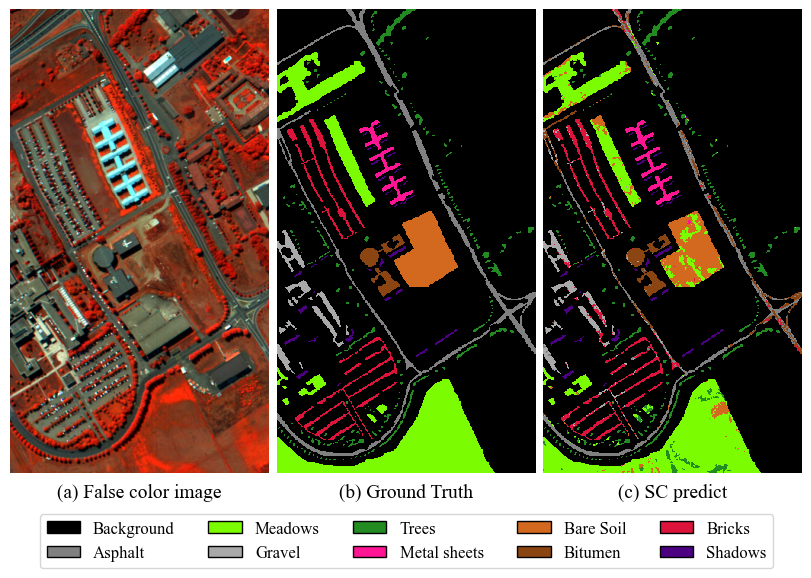

In [82]:
fig, axs = plt.subplots(1, 3, figsize=(8, 10), constrained_layout=True)

axs[0].imshow(linear_stretch(image[..., [80, 30, 10]]))
axs[0].set_title('(a) False color image', fontsize=14, y=-0.07)
axs[0].axis('off')

# 创建自定义colormap
cmap = ListedColormap(pu_colors)
axs[1].imshow(image_gt, cmap=cmap, vmin=0, vmax=9, interpolation='nearest')
axs[1].axis('off')
axs[1].set_title('(b) Ground Truth', fontsize=14, y=-0.07)

cmap = ListedColormap(pu_colors)
axs[2].imshow(pred, cmap=cmap, vmin=0, vmax=9, interpolation='nearest')
axs[2].axis('off')
axs[2].set_title('(c) SC predict', fontsize=14, y=-0.07)

# 创建图例
legend_elements = []
for i, (name, color) in enumerate(zip(pu_class_names, pu_colors)):
    legend_elements.append(Patch(facecolor=color, edgecolor='black', label=f'{name}'))

# 在图形下方添加图例
fig.legend(handles=legend_elements, loc='right', ncol=5, 
           bbox_to_anchor=(0.97, 0.20), fontsize=12, frameon=True);